# Setup

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import scanpy as sc
import pandas as pd

In [4]:
import seaborn as sns

import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# # show figures in the notebook
# %matplotlib inline 


sc.settings.set_figure_params(dpi=300) # save umaps as non-vectorial hi-res images
# plt.rcParams['figure.figsize']=(10,10) # make figures square if not using the setting bellow

# # show figures in the notebook
# %matplotlib inline 


In [5]:
import sys
sys.path.append('/home/angela/src/scVI_TSP/')
sys.path.append('/home/angela/sapiens/tabula-sapiens/')
from utils.annotations_utils import *
from utils.colorDict import *
from utils.general_utils import *
from utils.plotting_utils import *

# Load the color dictionaries

In [6]:
donors_color_dict = donor_colors()
tissues_color_dict = tissue_colors()
methods_color_dict = method_colors()
compartments_color_dict = compartment_colors()

In [7]:
display(donors_color_dict)
plot_colortable(donors_color_dict,'donor_colors')
plt.savefig("./figures/donor_color_dict.pdf")

{'TSP1': '#40b5c4', 'TSP2': '#081d58'}

In [8]:
display(tissues_color_dict)
plot_colortable(tissues_color_dict,'tissue_colors')
plt.savefig("./figures/tissue_color_dict.pdf")

{'Bladder': '#e7969c',
 'Blood': '#d6616b',
 'Bone_Marrow': '#cedb9c',
 'Kidney': '#7b4173',
 'Large_Intestine': '#31a354',
 'Lung': '#3182bd',
 'Lymph_Node': '#8c6d31',
 'Muscle': '#e7ba52',
 'Pancreas': '#fd8d3c',
 'Skin': '#ce6dbd',
 'Small_Intestine': '#6baed6',
 'Spleen': '#393b79',
 'Thymus': '#9c9ede',
 'Trachea': '#969696',
 'Vasculature': '#843c39'}

In [9]:
display(methods_color_dict)
plot_colortable(methods_color_dict,'method_colors')
plt.savefig("./figures/method_color_dict.pdf")

{'10X': '#90ee90', 'smartseq2': '#006400'}

In [10]:
display(compartments_color_dict)
plot_colortable(compartments_color_dict,'compartment_colors')
plt.savefig("./figures/compartment_color_dict.pdf")

{'Endothelial': '#fed976',
 'Epithelial': '#fd8c3c',
 'Immune': '#e2191c',
 'Stromal': '#800026'}

# Load the data

In [11]:
data_path = "/mnt/ibm_lg/angela/sapiens/data/sapiens_paper1/"

In [12]:
adata = sc.read_h5ad(data_path + "Pilot1_Pilot2.Final.h5ad")
adata = remove_cats(adata)
adata

AnnData object with n_obs × n_vars = 203513 × 58870
    obs: '10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor', 'smartseq2_sorted_population', '10X_replicate', '10X_sample', 'sequencer', 'sex', 'anatomical_position', 'tissue', 'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch', 'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred', 'propagated_cell_ontology_class', 'manual_cell_ontology_class'
    var: 'feature_types-0-0', 'n_cells-0-0', 'gene_symbol-0-0', 'n_cells-1-0', 'n_cells-0', 'feature_types-0-0-1', 'gene_symbol-0-0-1', 'n_cells-1-0-1', 'n_cells-1-1', 'n_cells', 'ensemble_id'
    uns: 'compartment_colors', 'compartment_pred_colors', 'donor_colors', 'donor_tech_colors', 'method_colors', 'neighbors', 'tissue_colors', 'umap'
    obsm: 'UMAP_donor_tech.100', 'UMAP_donor_tech.200', 'UMAP_donor_tech.50', 'X_scvi', 'X_scvi_donor_t

Make sure the colors are set correctly

In [13]:
adata

AnnData object with n_obs × n_vars = 203513 × 58870
    obs: '10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor', 'smartseq2_sorted_population', '10X_replicate', '10X_sample', 'sequencer', 'sex', 'anatomical_position', 'tissue', 'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch', 'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred', 'propagated_cell_ontology_class', 'manual_cell_ontology_class'
    var: 'feature_types-0-0', 'n_cells-0-0', 'gene_symbol-0-0', 'n_cells-1-0', 'n_cells-0', 'feature_types-0-0-1', 'gene_symbol-0-0-1', 'n_cells-1-0-1', 'n_cells-1-1', 'n_cells', 'ensemble_id'
    uns: 'compartment_colors', 'compartment_pred_colors', 'donor_colors', 'donor_tech_colors', 'method_colors', 'neighbors', 'tissue_colors', 'umap'
    obsm: 'UMAP_donor_tech.100', 'UMAP_donor_tech.200', 'UMAP_donor_tech.50', 'X_scvi', 'X_scvi_donor_t

In [14]:
adata.uns['donor_colors'] = list(donors_color_dict.values())
adata.uns['method_colors'] = list(methods_color_dict.values())
adata.uns['compartment_pred_colors'] = list(compartments_color_dict.values())
adata.uns['tissue_colors'] = list(tissues_color_dict.values())

... storing '10X_run' as categorical
... storing 'smartseq2_barcode' as categorical
... storing 'smartseq2_library_plate' as categorical
... storing 'smartseq2_sorting_direction' as categorical
... storing 'smartseq2_sort_order' as categorical
... storing 'smartseq2_cDNA_Plate' as categorical
... storing 'method' as categorical
... storing 'notes' as categorical
... storing 'donor' as categorical
... storing 'smartseq2_sorted_population' as categorical
... storing '10X_replicate' as categorical
... storing '10X_sample' as categorical
... storing 'sequencer' as categorical
... storing 'sex' as categorical
... storing 'anatomical_position' as categorical
... storing 'tissue' as categorical
... storing 'smartseq2_well_seq' as categorical
... storing '10X_barcode' as categorical
... storing 'donor_tech_tissue' as categorical
... storing 'donor_tech' as categorical
... storing 'compartment' as categorical
... storing 'compartment_pred' as categorical
... storing 'propagated_cell_ontology_cl

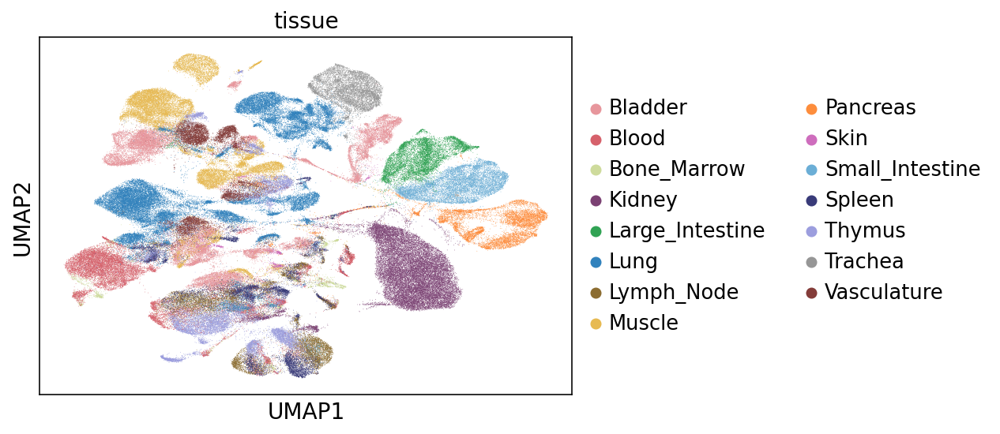

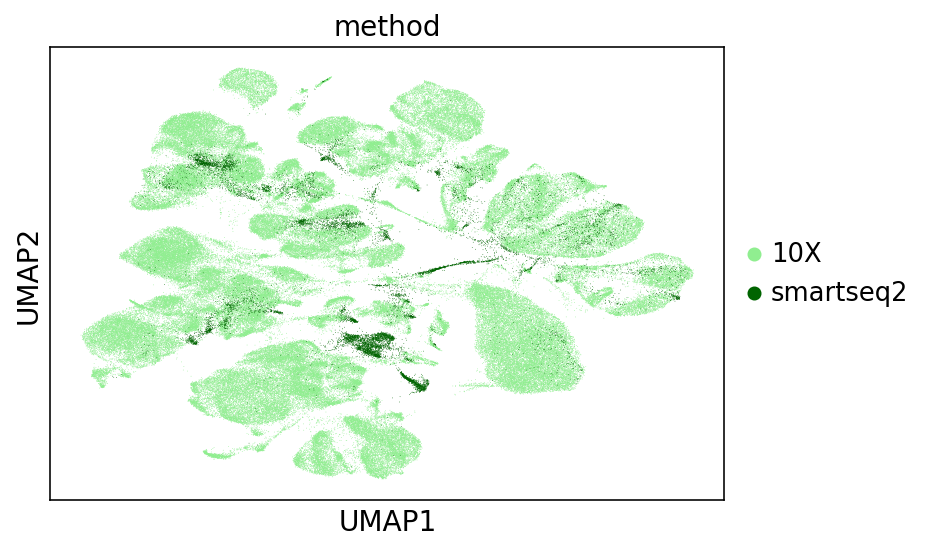

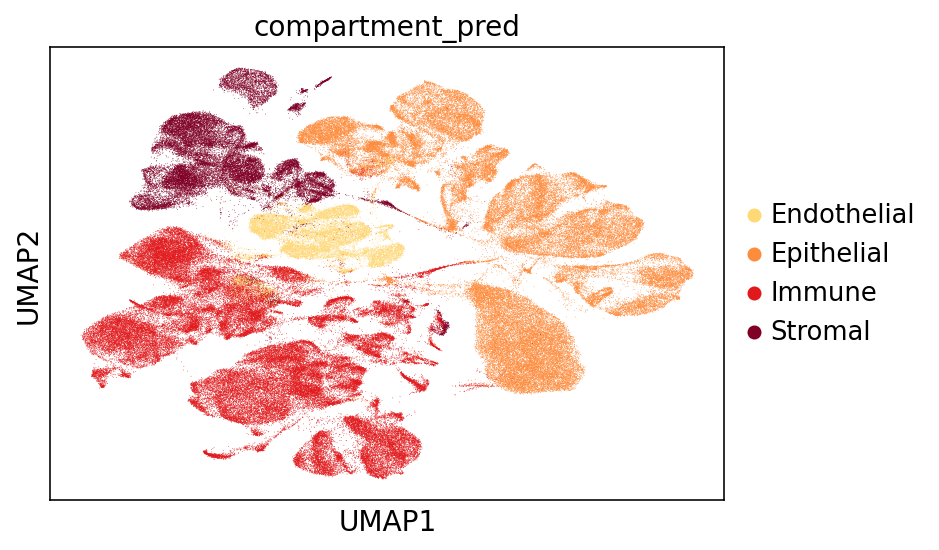

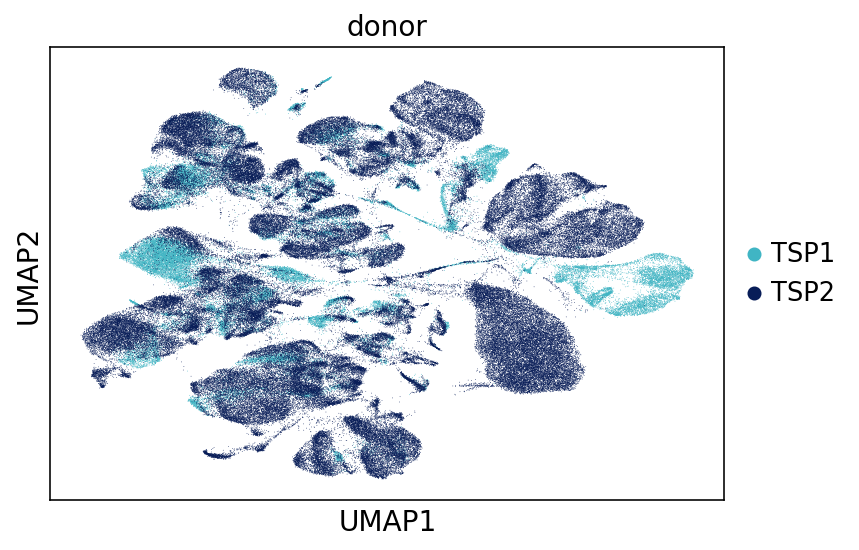

In [37]:
colorbylist = ['tissue','method','compartment_pred','donor']
for c in colorbylist:
    sc.pl.umap(adata,
           color=c,
           save = "_global_"+c+".pdf"
          )

# Look at `n_genes` and `n_counts` across the dataset 

In [39]:
adata = remove_cats(adata)
metadata = adata.obs.copy()

In [18]:
pd.DataFrame(metadata.groupby(['tissue','anatomical_position','method'])['cell_id'].count())

cell_id
tissue          anatomical_position method            
Bladder         nan                 10X          24749
                                    smartseq2     1002
Blood           nan                 10X          15174
                                    smartseq2      843
Bone_Marrow     nan                 smartseq2      325
                vertebralbody       10X           2860
Kidney          nan                 10X          23851
                                    smartseq2      386
Large_Intestine distal              10X           3983
                nan                 smartseq2      388
                proximal            10X           3822
Lung            MedialDistal        smartseq2      332
                Neuron              smartseq2      298
                Proximal            smartseq2      396
                nan                 10X          14780
                                    smartseq2      484
                proxmedialdistal    10X          20872
Lymph_Node      nan                 10X           9119
                                    smartseq2      945
Muscle          diaphragm           10X           5071
                nan                 10X           2771
                                    smartseq2     2556
                rectusabdominus     10X          11333
Pancreas        Endocrine           10X           1724
                                    smartseq2      721
                Exocrine            10X           5963
                                    smartseq2      485
Skin            abdomen             10X              2
                nan                 smartseq2      856
Small_Intestine distal              10X            823
                nan                 smartseq2      624
                proximal            10X           8099
Spleen          nan                 10X           7298
                                    smartseq2     1068
Thymus          nan                 10X          12501
                                    smartseq2      393
Trachea         nan                 10X           7911
                                    smartseq2      122
Vasculature     Aorta               10X           8310
                nan                 smartseq2      273

In [22]:
tissues_color_dict.keys()

dict_keys(['Bladder', 'Blood', 'Bone_Marrow', 'Kidney', 'Large_Intestine', 'Lung', 'Lymph_Node', 'Muscle', 'Pancreas', 'Skin', 'Small_Intestine', 'Spleen', 'Thymus', 'Trachea', 'Vasculature'])

In [24]:
import matplotlib.ticker as tkr
sns.set(font_scale=2) 

tissue_order = list(tissues_color_dict.keys())
# f, ax = plt.subplots() 
g = sns.FacetGrid(
    metadata[metadata['method']=='smartseq2'], 
    col="tissue", col_wrap=5, height=6, aspect=.8, 
    col_order=tissue_order)#, ylim=(0, 10))
g.map(sns.boxplot, "donor", "n_genes",order=["TSP1","TSP2"], palette=donors_color_dict)#, ci=None);
plt.tight_layout()
plt.savefig("figures/ts_smartseq2_ngenes.pdf")

g = sns.FacetGrid(
    metadata[metadata['method']=='smartseq2'], 
    col="tissue", col_wrap=5, height=6, aspect=.8, 
    col_order=tissue_order)#, ylim=(0, 10))
g.map(sns.boxplot, "donor", "n_counts",order=["TSP1","TSP2"], palette=donors_color_dict)#, ci=None);
plt.tight_layout()
plt.savefig("figures/ts_smartseq2_ncounts.pdf")

g = sns.FacetGrid(
    metadata[metadata['method']=='10X'], 
    col="tissue", col_wrap=5, height=6, aspect=.8, 
    col_order=tissue_order)#, ylim=(0, 10))
g.map(sns.boxplot, "donor", "n_genes",order=["TSP1","TSP2"], palette=donors_color_dict)#, ci=None);
plt.tight_layout()
plt.savefig("figures/ts_10X_ncounts.pdf")

g = sns.FacetGrid(
    metadata[metadata['method']=='10X'], 
    col="tissue", col_wrap=5, height=6, aspect=.8, 
    col_order=tissue_order)#, ylim=(0, 10))
g.map(sns.boxplot, "donor", "n_counts",order=["TSP1","TSP2"], palette=donors_color_dict)#, ci=None);
ax = plt.gca()
ax.yaxis.set_major_formatter(tkr.FuncFormatter(lambda x, p: "{:.0e}".format(x)))
plt.tight_layout()
plt.savefig("figures/ts_10X_ngenes.pdf")

# Sankey diagram for compartment cell type

In [38]:
import plotly
import chart_studio.plotly as py
# import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [40]:
metadata.columns

Index(['10X_run', 'smartseq2_barcode', 'smartseq2_library_plate',
       'smartseq2_sorting_direction', 'smartseq2_sort_order',
       'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor',
       'smartseq2_sorted_population', '10X_replicate', '10X_sample',
       'sequencer', 'sex', 'anatomical_position', 'tissue',
       'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch',
       'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred',
       'propagated_cell_ontology_class', 'manual_cell_ontology_class'],
      dtype='object')

In [42]:
metadata.groupby(
    ['manual_cell_ontology_class','propagated_cell_ontology_class']
).count()

10X_run  \
manual_cell_ontology_class propagated_cell_ontology_class                    
B cell                     B cell                                     1911   
                           T cell                                       12   
                           capillary endothelial cell                    5   
                           classical monocyte                            1   
                           dendritic cell, human                         5   
...                                                                    ...   
vein endothelial cell      myeloid dendritic cell, human                 1   
                           natural killer cell                           1   
                           non-classical monocyte                        2   
                           vascular associated smooth muscle cell        1   
                           vein endothelial cell                       542   

                                                                   smartseq2_barcode  \
manual_cell_ontology_class propagated_cell_ontology_class                              
B cell                     B cell                                               1911   
                           T cell                                                 12   
                           capillary endothelial cell                              5   
                           classical monocyte                                      1   
                           dendritic cell, human                                   5   
...                                                                              ...   
vein endothelial cell      myeloid dendritic cell, human                           1   
                           natural killer cell                                     1   
                           non-classical monocyte                                  2   
                           vascular associated smooth muscle cell                  1   
                           vein endothelial cell                                 542   

                                                                   smartseq2_library_plate  \
manual_cell_ontology_class propagated_cell_ontology_class                                    
B cell                     B cell                                                     1911   
                           T cell                                                       12   
                           capillary endothelial cell                                    5   
                           classical monocyte                                            1   
                           dendritic cell, human                                         5   
...                                                                                    ...   
vein endothelial cell      myeloid dendritic cell, human                                 1   
                           natural killer cell                                           1   
                           non-classical monocyte                                        2   
                           vascular associated smooth muscle cell                        1   
                           vein endothelial cell                                       542   

                                                                   smartseq2_sorting_direction  \
manual_cell_ontology_class propagated_cell_ontology_class                                        
B cell                     B cell                                                         1911   
                           T cell                                                           12   
                           capillary endothelial cell                                        5   
                           classical monocyte                                                1   
                           dendritic cell, human                                             5  

In [43]:
df = metadata.groupby(#,'manual_cell_ontology_class'
    ['tissue','propagated_cell_ontology_class','compartment_pred']).agg({'cell_id':len}).reset_index()
display(df.shape)
df = df[df['cell_id']>10]
display(df.shape)

(539, 4)

(333, 4)

In [44]:
for comp in ['Endothelial','Immune','Epithelial','Stromal','all']:
    if comp == 'all':
        fig = genSankey(df,
                        cat_cols=['tissue','propagated_cell_ontology_class','compartment_pred'],
                        cat_cols_color = [tissues_color_dict,'#00A1E0',compartments_color_dict],
                        value_cols='cell_id',
                        title='tissue_cell_type')
        iplot(fig, validate=False)
        plotly.offline.plot(fig, validate=False, filename="figures/sankey_"+comp+".html", output_type='div')
    else:
        fig = genSankey(df[df['compartment_pred']==comp],
                        cat_cols=['tissue','propagated_cell_ontology_class'],
                        cat_cols_color = [tissues_color_dict,compartments_color_dict[comp]],
                        value_cols='cell_id',
                        title=comp)
        iplot(fig, validate=False)
        plotly.offline.plot(fig, validate=False, filename="figures/sankey_"+comp+".html", output_type='div')

# Write to table to make ballon plot in R

In [45]:
adata = remove_cats(adata)
adata.obs['trickR'] = 'Tissue'
pd.DataFrame(adata.obs.groupby(
    ['tissue','anatomical_position','method','donor','trickR'])['cell_id'].count()).reset_index()#.to_csv("sapiens_metadata_ballon_plot.csv")


,tissue,anatomical_position,method,donor,trickR,cell_id
0,Bladder,nan,10X,TSP1,Tissue,14337
1,Bladder,nan,10X,TSP2,Tissue,10412
2,Bladder,nan,smartseq2,TSP1,Tissue,739
3,Bladder,nan,smartseq2,TSP2,Tissue,263
4,Blood,nan,10X,TSP1,Tissue,3865
5,Blood,nan,10X,TSP2,Tissue,11309
6,Blood,nan,smartseq2,TSP1,Tissue,317
7,Blood,nan,smartseq2,TSP2,Tissue,526
8,Bone_Marrow,nan,smartseq2,TSP2,Tissue,325
9,Bone_Marrow,vertebralbody,10X,TSP2,Tissue,2860


# Summary statistics

In [16]:
adata.obs.columns

Index(['10X_run', 'smartseq2_barcode', 'smartseq2_library_plate',
       'smartseq2_sorting_direction', 'smartseq2_sort_order',
       'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor',
       'smartseq2_sorted_population', '10X_replicate', '10X_sample',
       'sequencer', 'sex', 'anatomical_position', 'tissue',
       'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch',
       'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred',
       'propagated_cell_ontology_class', 'manual_cell_ontology_class'],
      dtype='object')

In [25]:
print('all',len(set(adata.obs['propagated_cell_ontology_class'])))
for c in set(adata.obs['compartment_pred']):
    comp = adata.obs[adata.obs['compartment_pred']==c]
    print(c,len(set(comp['propagated_cell_ontology_class'])))
for t in set(adata.obs['tissue']):
    tiss = adata.obs[adata.obs['tissue']==t]
    
    print(t,len(set(tiss['propagated_cell_ontology_class'])))

all 110
Stromal 60
Endothelial 63
Immune 84
Epithelial 88
Lymph_Node 15
Pancreas 9
Muscle 17
Vasculature 12
Kidney 8
Large_Intestine 13
Thymus 27
Bladder 18
Lung 34
Small_Intestine 15
Spleen 15
Bone_Marrow 11
Skin 12
Trachea 9
Blood 18


# Velocyto

In [7]:
adata_velocyto = sc.read_h5ad(
    "/mnt/ibm_sm/home/lily_li/tabula_sapiens/rna_velocity_outputs/TSP1_bladder_1/counts_unfiltered/adata.h5ad")
adata_velocyto

AnnData object with n_obs × n_vars = 363687 × 58367 
    layers: 'spliced', 'unspliced'

In [8]:
adata

AnnData object with n_obs × n_vars = 203513 × 58870 
    obs: '10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor', 'smartseq2_sorted_population', '10X_replicate', '10X_sample', 'sequencer', 'sex', 'anatomical_position', 'tissue', 'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch', 'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred', 'propagated_cell_ontology_class', 'manual_cell_ontology_class'
    var: 'feature_types-0-0', 'n_cells-0-0', 'gene_symbol-0-0', 'n_cells-1-0', 'n_cells-0', 'feature_types-0-0-1', 'gene_symbol-0-0-1', 'n_cells-1-0-1', 'n_cells-1-1', 'n_cells', 'ensemble_id'
    uns: 'compartment_colors', 'compartment_pred_colors', 'donor_colors', 'donor_tech_colors', 'method_colors', 'neighbors', 'tissue_colors', 'umap'
    obsm: 'UMAP_donor_tech.100', 'UMAP_donor_tech.200', 'UMAP_donor_tech.50', 'X_scvi', 'X_scvi_donor_

In [9]:
adata_velocyto.obs['cell_id'] = adata_velocyto.obs.index + "_TSP1_bladder_1"
adata_velocyto.obs

,cell_id
barcode,
AAACCCAAGAAAGCGA,AAACCCAAGAAAGCGA_TSP1_bladder_1
AAACCCAAGAACGCGT,AAACCCAAGAACGCGT_TSP1_bladder_1
AAACCCAAGAAGCCTG,AAACCCAAGAAGCCTG_TSP1_bladder_1
AAACCCAAGAAGGCTC,AAACCCAAGAAGGCTC_TSP1_bladder_1
AAACCCAAGAAGGTAG,AAACCCAAGAAGGTAG_TSP1_bladder_1
...,...
TTTGTTGTCTTCCTAA,TTTGTTGTCTTCCTAA_TSP1_bladder_1
TTTGTTGTCTTGAACG,TTTGTTGTCTTGAACG_TSP1_bladder_1
TTTGTTGTCTTTCGAT,TTTGTTGTCTTTCGAT_TSP1_bladder_1


In [10]:
test = adata[adata.obs["cell_id"].isin(adata_velocyto.obs['cell_id'])].copy()

In [11]:
veltest = adata_velocyto[adata_velocyto.obs["cell_id"].isin(test.obs['cell_id'])].copy()

In [12]:
test,veltest

(AnnData object with n_obs × n_vars = 4974 × 58870 
     obs: '10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor', 'smartseq2_sorted_population', '10X_replicate', '10X_sample', 'sequencer', 'sex', 'anatomical_position', 'tissue', 'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch', 'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred', 'propagated_cell_ontology_class', 'manual_cell_ontology_class'
     var: 'feature_types-0-0', 'n_cells-0-0', 'gene_symbol-0-0', 'n_cells-1-0', 'n_cells-0', 'feature_types-0-0-1', 'gene_symbol-0-0-1', 'n_cells-1-0-1', 'n_cells-1-1', 'n_cells', 'ensemble_id'
     uns: 'compartment_colors', 'compartment_pred_colors', 'donor_colors', 'donor_tech_colors', 'method_colors', 'neighbors', 'tissue_colors', 'umap'
     obsm: 'UMAP_donor_tech.100', 'UMAP_donor_tech.200', 'UMAP_donor_tech.50', 'X_scvi', 'X_scvi_don

In [2]:
import scvelo as scv


/home/angela/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [16]:
test

AnnData object with n_obs × n_vars = 4974 × 58870 
    obs: '10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'cell_id', 'method', 'notes', 'donor', 'smartseq2_sorted_population', '10X_replicate', '10X_sample', 'sequencer', 'sex', 'anatomical_position', 'tissue', 'smartseq2_well_seq', '10X_barcode', 'n_counts', 'n_genes', 'batch', 'donor_tech_tissue', 'donor_tech', 'compartment', 'compartment_pred', 'propagated_cell_ontology_class', 'manual_cell_ontology_class'
    var: 'feature_types-0-0', 'n_cells-0-0', 'gene_symbol-0-0', 'n_cells-1-0', 'n_cells-0', 'feature_types-0-0-1', 'gene_symbol-0-0-1', 'n_cells-1-0-1', 'n_cells-1-1', 'n_cells', 'ensemble_id'
    uns: 'compartment_colors', 'compartment_pred_colors', 'donor_colors', 'donor_tech_colors', 'method_colors', 'neighbors', 'tissue_colors', 'umap'
    obsm: 'UMAP_donor_tech.100', 'UMAP_donor_tech.200', 'UMAP_donor_tech.50', 'X_scvi', 'X_scvi_donor_te

In [19]:
veltest.var

""
gene_id
ENSG00000277400.1
ENSG00000274847.1
ENSG00000276256.1
ENSG00000278198.1
ENSG00000273496.1
...
ENSG00000212907.2
ENSG00000198886.2
ENSG00000198786.2


In [21]:
test.var_names = test.var["ensemble_id"]

In [25]:
test.var

,feature_types-0-0,n_cells-0-0,gene_symbol-0-0,n_cells-1-0,n_cells-0,feature_types-0-0-1,gene_symbol-0-0-1,n_cells-1-0-1,n_cells-1-1,n_cells,ensemble_id
ensemble_id,,,,,,,,,,,
ENSG00000223972.5,Gene Expression,0,DDX11L1,2,2,Gene Expression,DDX11L1,21,25,50,ENSG00000223972.5
ENSG00000227232.5,Gene Expression,1,WASH7P,529,529,Gene Expression,WASH7P,598,795,1946,ENSG00000227232.5
ENSG00000278267.1,Gene Expression,0,MIR6859-1,7,7,Gene Expression,MIR6859-1,6,8,21,ENSG00000278267.1
ENSG00000243485.5,Gene Expression,0,MIR1302-2HG,4,4,Gene Expression,MIR1302-2HG,7,7,19,ENSG00000243485.5
ENSG00000284332.1,Gene Expression,0,MIR1302-2,0,0,Gene Expression,MIR1302-2,0,0,0,ENSG00000284332.1
...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000198695.2,Gene Expression,19450,MT-ND6,3662,23087,Gene Expression,MT-ND6,3344,3815,114054,ENSG00000198695.2
ENSG00000210194.1,Gene Expression,169,MT-TE,1289,1446,Gene Expression,MT-TE,502,512,3070,ENSG00000210194.1
ENSG00000198727.2,Gene Expression,43309,MT-CYB,4070,47347,Gene Expression,MT-CYB,3621,4116,202843,ENSG00000198727.2


In [17]:
veltest

AnnData object with n_obs × n_vars = 4974 × 58367 
    obs: 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    layers: 'spliced', 'unspliced'

In [23]:
testvel = scv.utils.merge(test, veltest)


In [24]:
scv.pp.moments(testvel)

Normalized count data: spliced, unspliced.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [26]:
scv.tl.velocity(testvel, mode='stochastic')

computing velocities
    finished (0:00:39) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [28]:
scv.pp.neighbors(testvel)

computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [29]:
scv.tl.velocity_graph(testvel)

computing velocity graph
    finished (0:00:50) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


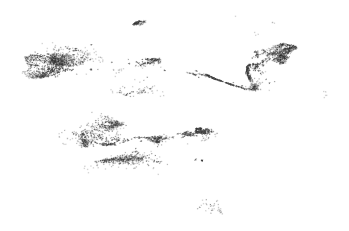

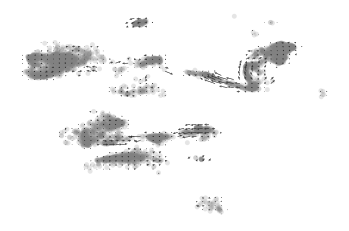

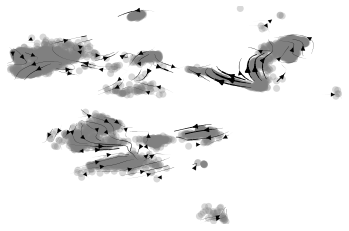

In [30]:
scv.pl.velocity_embedding(testvel, basis='umap')
scv.pl.velocity_embedding_grid(testvel, basis='umap')
scv.pl.velocity_embedding_stream(testvel, basis='umap')

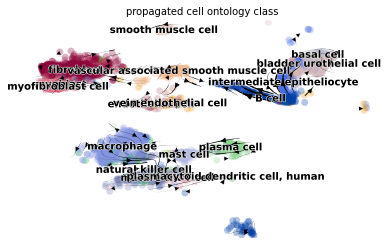

In [32]:
scv.pl.velocity_embedding_stream(testvel, basis='umap', color="propagated_cell_ontology_class")